# Installing Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.linear_model import LogisticRegression

# Loading Dataset and Checking out Head and Description

In [2]:
data = pd.read_csv("C:/Users/anany/OneDrive/Desktop/Assignment/FIM 590-005/creditcard.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


# Checking Nature of Amount in Fraud Transactions

In [17]:
# print(data[data['Class']==0]['Amount'].sum())
print(data[data['Class']==1]['Amount'].sum())

60127.97


In [5]:
data['Amount'].describe()

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

In [6]:
X=data.drop(['Amount','Class','Time'],axis=1)

# Exploratory Data Analysis

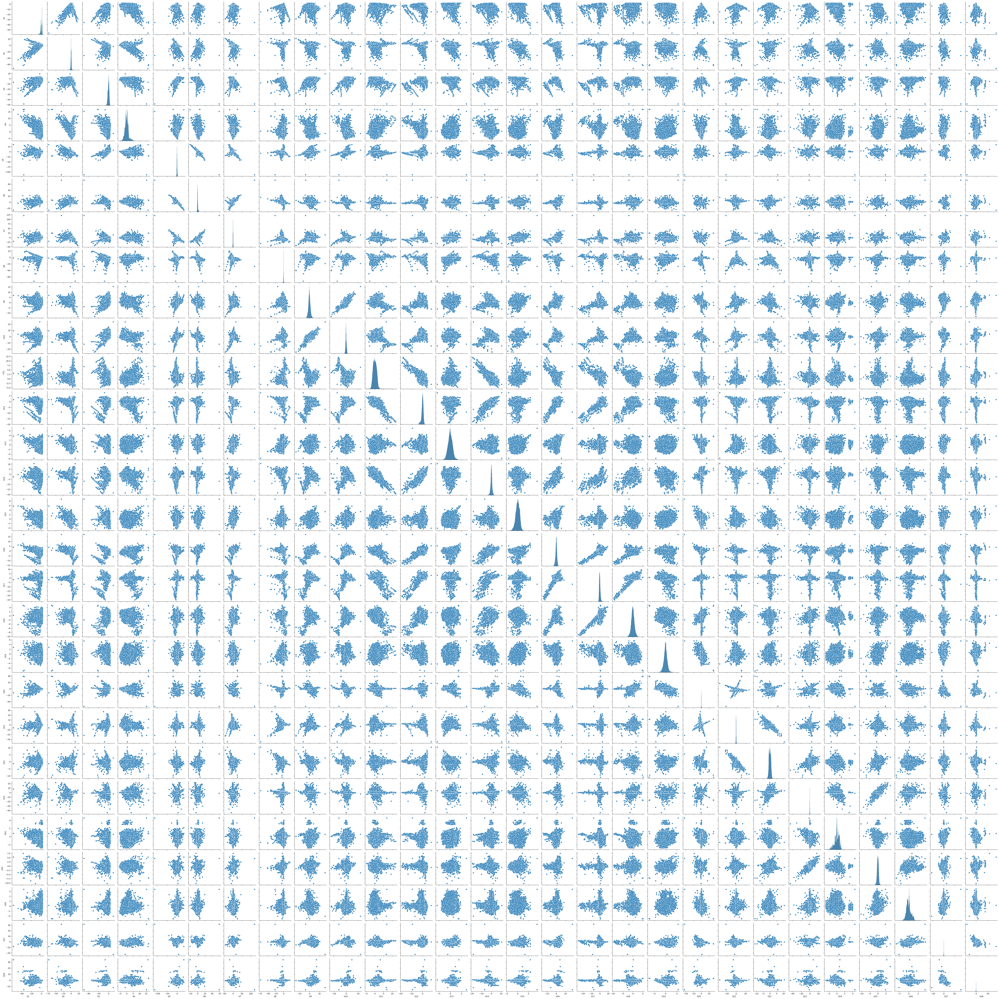

In [7]:
sns.pairplot(X)
plt.show()

In [8]:
np.percentile(data['Amount'],99)

1017.9700000000012

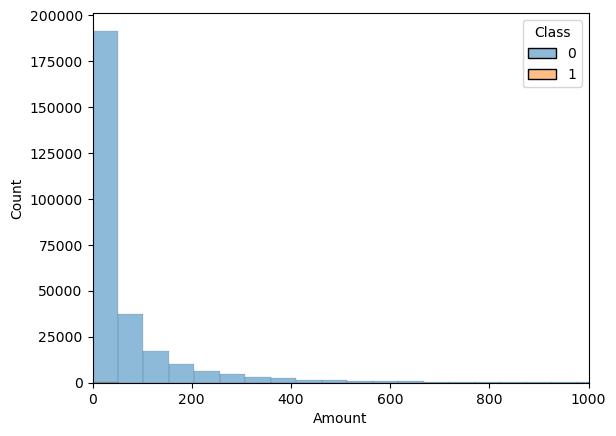

In [10]:
sns.histplot(data,x='Amount',hue='Class',bins=500)
plt.xlim(0,1000)
plt.show()

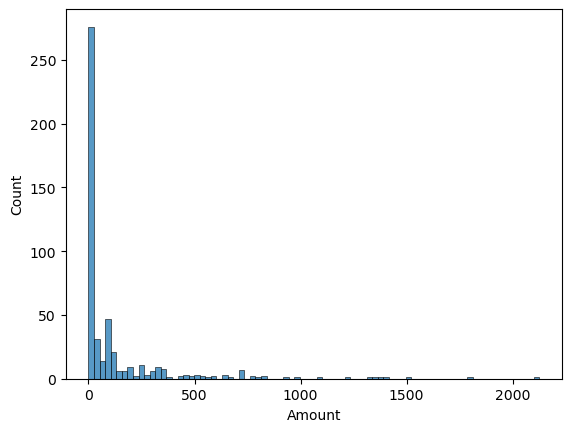

In [11]:
data_fraud=data[data['Class']==1]
sns.histplot(data_fraud['Amount'])
plt.show()

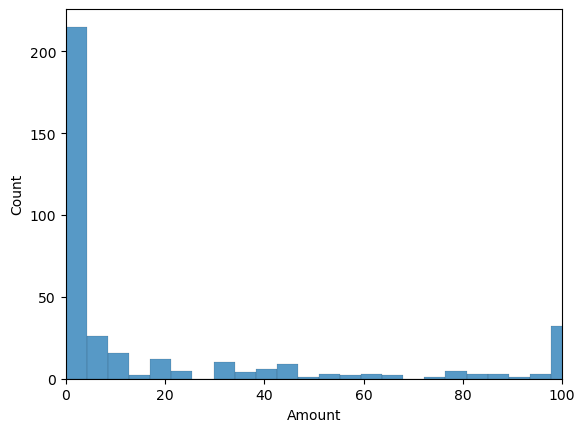

In [12]:
sns.histplot(data_fraud['Amount'],bins=500)
plt.xlim(0,100)
plt.show()

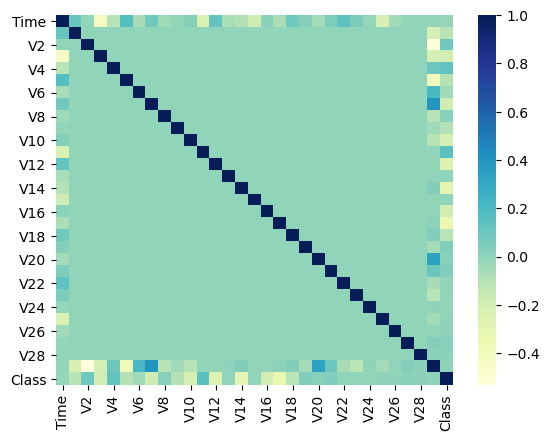

In [13]:
sns.heatmap(data.corr(),cmap="YlGnBu")
plt.show()

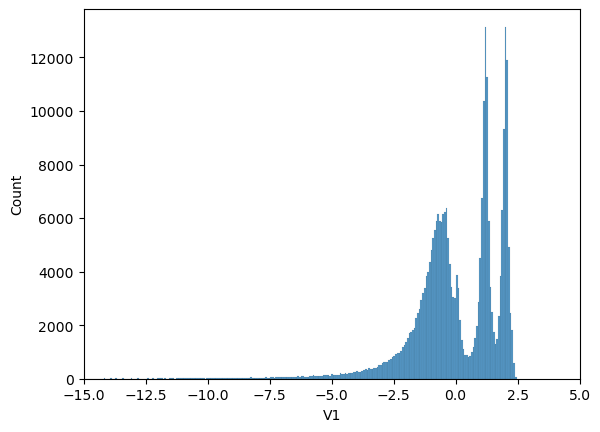

In [14]:
data_genuine=data[data['Class']==0]
data_fraud=data[data['Class']==1]
sns.histplot(data['V1'])
plt.xlim(-15,5)
plt.show()

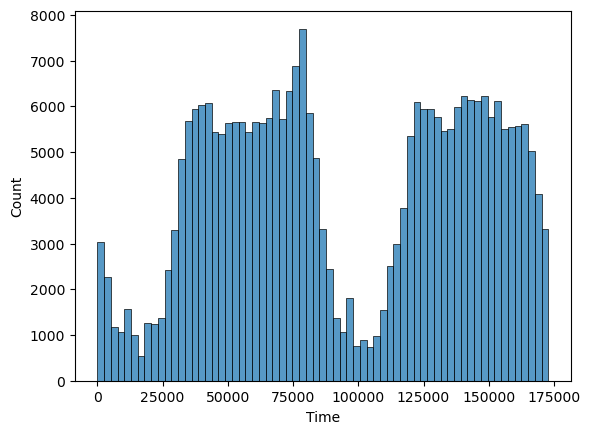

In [15]:
sns.histplot(data=data[data['Class']==0],x='Time')
plt.show()

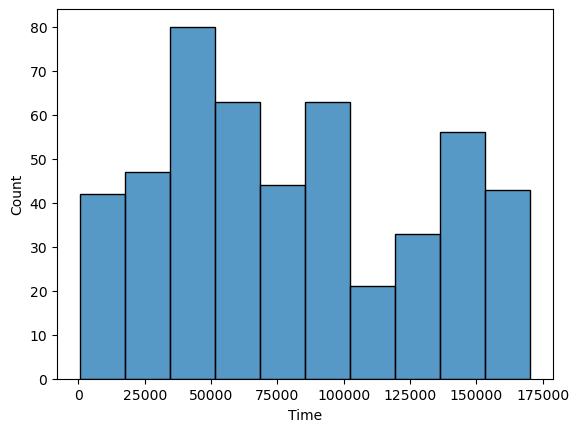

In [16]:
sns.histplot(data=data_fraud,x='Time')
plt.show()

# Checking Data for Multicollinearity and preparing Features 

In [18]:
#VIF to check for multicollinearity
VIF=pd.DataFrame()
VIF['features']=data.columns
VIF['VIF']= [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
VIF

,features,VIF
0,Time,2.339858
1,V1,1.638237
2,V2,3.900804
3,V3,1.321018
4,V4,1.172479
5,V5,2.764441
6,V6,1.528629
7,V7,2.603517
8,V8,1.098591
9,V9,1.037715


In [19]:
#Features and Target
X=data.drop(['Time','Amount','Class'],axis=1)
y=data['Class']

# Considering Imbalance in the categories, we oversample the minority class

In [20]:
#SMOTE
from imblearn.over_sampling import SMOTE
from collections import Counter
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({0: 284315, 1: 284315})


# Model 1: Logistic Regression Fitting and generating performance measures

In [21]:
X_train,X_test,y_train,y_test=train_test_split(X_res,y_res,test_size=0.7)
logistic_regression=LogisticRegression()
logistic_regression.fit(X_train,y_train)
y_pred=logistic_regression.predict(X_test)
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
print('Recall: ',metrics.recall_score(y_test, y_pred))
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold=KFold(n_splits=5)
results=cross_val_score(logistic_regression,X_res,y_res,cv=kfold)
print(results)
print('Accuracy mean',results.mean(),'Accuary Std',results.std())

Recall:  0.9148730739831838
[0.93498408 0.94058527 0.94145578 0.8982027  0.89822908]
Accuracy mean 0.9226913810386368 Accuary Std 0.020107233932163487


# Testing the model on a sample of fraudulent transactions

In [22]:
data_fraud=data[data['Class']==1]
X_fraud=data_fraud.drop(['Time','Amount','Class'],axis=1)
y_fraud=data_fraud['Class']
y_pred_fraud=logistic_regression.predict(X_fraud)
data_fraud['Prediction']=y_pred_fraud
actual_loss=np.sum(data_fraud['Amount'])
predicted_loss=np.sum(data_fraud['Amount']*data_fraud['Prediction'])
print(actual_loss)
print(predicted_loss)

60127.97
52918.490000000005


<ipython-input-22-dfb569431c40>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fraud['Prediction']=y_pred_fraud


# Feature Importance in the model

Feature: 0, Score: 0.33071
Feature: 1, Score: -0.24974
Feature: 2, Score: 0.12750
Feature: 3, Score: 1.02380
Feature: 4, Score: 0.18096
Feature: 5, Score: -0.24427
Feature: 6, Score: 0.24113
Feature: 7, Score: -0.61770
Feature: 8, Score: -0.39109
Feature: 9, Score: -1.06027
Feature: 10, Score: 0.61971
Feature: 11, Score: -1.09561
Feature: 12, Score: -0.39491
Feature: 13, Score: -1.36426
Feature: 14, Score: 0.05229
Feature: 15, Score: -0.66197
Feature: 16, Score: -0.82359
Feature: 17, Score: -0.24814
Feature: 18, Score: 0.15345
Feature: 19, Score: -0.12579
Feature: 20, Score: 0.23581
Feature: 21, Score: 0.34961
Feature: 22, Score: -0.18648
Feature: 23, Score: -0.08230
Feature: 24, Score: -0.10389
Feature: 25, Score: -0.54589
Feature: 26, Score: 0.44410
Feature: 27, Score: 0.44219


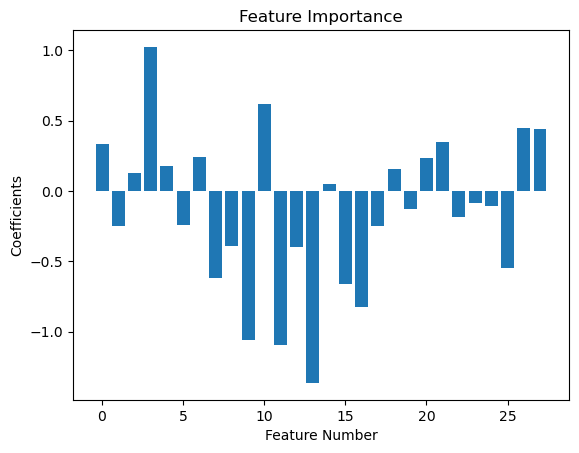

In [23]:
importance = logistic_regression.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.title('Feature Importance')
plt.xlabel('Feature Number')
plt.ylabel('Coefficients')
plt.show()

# Testing Model on the Top 10 Frauds (Amount basis)

In [24]:
data_fraud_desc=data_fraud.sort_values('Amount',ascending=False)
top_ten_fraud=data_fraud_desc[:10]
top_ten_fraud.head()
x_top_ten_fraud=top_ten_fraud.drop(['Time','Amount','Class','Prediction'],axis=1)
y_top_ten_fraud=top_ten_fraud['Class']
y_pred_t10fraud=logistic_regression.predict(x_top_ten_fraud)
top_ten_fraud['Prediction2']=y_pred_t10fraud
actual_loss=np.sum(top_ten_fraud['Amount'])
predicted_loss=np.sum(top_ten_fraud['Amount']*top_ten_fraud['Prediction2'])
print(actual_loss)
print(predicted_loss)

14233.6
11010.740000000002


<ipython-input-24-8a5d8bd96f22>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_ten_fraud['Prediction2']=y_pred_t10fraud


# Model 2: MLP Classifier Fitting and generating performance measures

In [25]:
MLPC=MLPClassifier(hidden_layer_sizes=(200,),max_iter=50,random_state=123)
MLPC.fit(X_train,y_train)
#prediction and recall
y_pred=MLPC.predict(X_test)
recall=recall_score(y_test,y_pred)
print(recall)

1.0


In [26]:
#cross validation 5 fold CV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold=KFold(n_splits=5)
results=cross_val_score(MLPC,X_res,y_res,cv=kfold)
print(results)
print('Accuracy mean',results.mean(),'Accuracy Std',results.std())

[0.99702794 0.99770501 0.99963069 1.         0.99992966]
Accuracy mean 0.9988586602887641 Accuary Std 0.0012432335337390517


# Testing the model on a sample of fraudulent transactions

In [27]:
data_fraud=data[data['Class']==1]
X_fraud=X=data_fraud.drop(['Time','Amount','Class'],axis=1)
y_fraud=data_fraud['Class']
y_pred_fraud=MLPC.predict(X_fraud)
data_fraud['predicted']=y_pred_fraud
actual_loss=np.sum(data_fraud['Amount'])
predicted_loss=np.sum(data_fraud['Amount']*data_fraud['predicted'])
print(actual_loss)
print(predicted_loss)

60127.97
60127.97


<ipython-input-27-0124d21824e1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fraud['predicted']=y_pred_fraud


# Testing Model on the Top 10 Frauds (Amount basis)

In [28]:
data_fraud_desc=data_fraud.sort_values('Amount',ascending=False)
data_fraud_desc.head()
top_ten_fraud=data_fraud_desc[:10]
top_ten_fraud.head()
x_top_ten_fraud=top_ten_fraud.drop(['Time','Amount','Class','predicted'],axis=1)
y_top_ten_fraud=top_ten_fraud['Class']
y_pred_t10fraud=MLPC.predict(x_top_ten_fraud)
top_ten_fraud['Prediction2']=y_pred_t10fraud

<ipython-input-28-32190df7ab74>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_ten_fraud['Prediction2']=y_pred_t10fraud


In [29]:
actual_loss=np.sum(top_ten_fraud['Amount'])
predicted_loss=np.sum(top_ten_fraud['Amount']*top_ten_fraud['Prediction2'])
print(actual_loss)
print(predicted_loss)

14233.6
14233.6


# Model 3: XGBoost Classifier Fitting and generating performance measures

In [30]:
XGBC=XGBClassifier()
XGBC.fit(X_train,y_train)
y_pred=XGBC.predict(X_test)

C:\Users\anany\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:48:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [31]:
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
print('Recall: ',metrics.recall_score(y_test, y_pred))
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold=KFold(n_splits=5)
results=cross_val_score(XGBC,X_res,y_res,cv=kfold)
print(results)
print('Accuracy mean',results.mean(),'Accuary Std',results.std())

Recall:  0.9999547411192018


C:\Users\anany\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:53:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\anany\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:55:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\anany\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:58:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\anany\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:01:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\anany\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:03:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0.99687846 0.99778415 0.99961311 1.         1.        ]
Accuracy mean 0.9988551430631517 Accuary Std 0.0012845387549339942


# Testing the model on a sample of fraudulent transactions

In [33]:
data_fraud=data[data['Class']==1]
X_fraud=X=data_fraud.drop(['Time','Amount','Class'],axis=1)
y_fraud=data_fraud['Class']
y_pred_fraud=XGBC.predict(X_fraud)
data_fraud['predicted']=y_pred_fraud
actual_loss=np.sum(data_fraud['Amount'])
predicted_loss=np.sum(data_fraud['Amount']*data_fraud['predicted'])
print(actual_loss)
print(predicted_loss)

60127.97
60127.97


<ipython-input-33-dde4b9dd117b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fraud['predicted']=y_pred_fraud


# Testing Model on the Top 10 Frauds (Amount basis)

In [34]:
data_fraud_desc=data_fraud.sort_values('Amount',ascending=False)
data_fraud_desc.head()
top_ten_fraud=data_fraud_desc[:10]
top_ten_fraud.head()
x_top_ten_fraud=top_ten_fraud.drop(['Time','Amount','Class','predicted'],axis=1)
y_top_ten_fraud=top_ten_fraud['Class']
y_pred_t10fraud=XGBC.predict(x_top_ten_fraud)
top_ten_fraud['Prediction2']=y_pred_t10fraud

<ipython-input-34-5674ab35869a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_ten_fraud['Prediction2']=y_pred_t10fraud


In [35]:
actual_loss=np.sum(top_ten_fraud['Amount'])
predicted_loss=np.sum(top_ten_fraud['Amount']*top_ten_fraud['Prediction2'])
print(actual_loss)
print(predicted_loss)

14233.6
14233.6


# Feature Importance

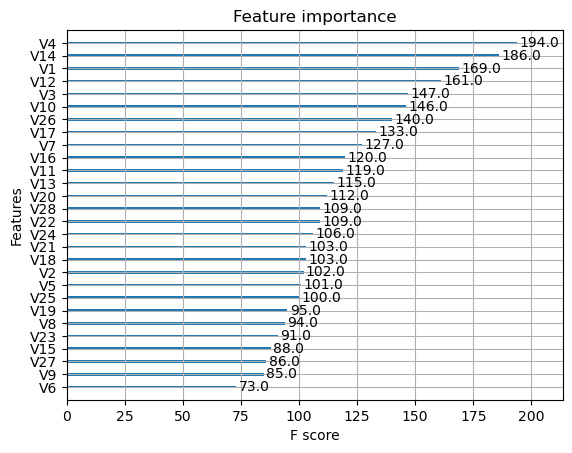

In [36]:
plot_importance(XGBC)
plt.show()